In [11]:
# Cell 1: Setup and Imports

import os
import random
import numpy as np
import pandas as pd
import json
from typing import List, Dict, Tuple, Optional, Any

# these are for solving the electrical math really fast
from scipy.sparse import lil_matrix, csr_matrix
from scipy.sparse.linalg import factorized, spsolve

# for smoothing our noise to make it more real
from scipy.ndimage import gaussian_filter



from settings import settings as s

# Set up plotting for visualization
import matplotlib.pyplot as plt
import seaborn as sns



In [12]:
# Cell 2: Physics Helper Functions

def make_resistors() -> List[Tuple[str, int, int]]:
    """
    Generates all the tiny "wires" (resistors) that connect our grid's nodes.
    Each wire is either 'h'orizontal or 'v'ertical, identified by its type and
    its starting grid coordinate.
    """
    resistors = []
    # Horizontal wires connect (i,j) to (i, j+1)
    for i in range(s.grid_size_x):
        for j in range(s.grid_size_y - 1):
            resistors.append(('h', i, j))
    # Vertical wires connect (i,j) to (i+1, j)
    for i in range(s.grid_size_x - 1):
        for j in range(s.grid_size_y):
            resistors.append(('v', i, j))
    return resistors

def make_perimeter(num_rows: int, num_cols: int) -> List[Tuple[int, int]]:
    """
    Figures out all the nodes (junctions) that are on the very edge of our grid,
    listing them nicely in a continuous, clockwise order.
    """
    perimeter = []
    # Top edge (from left to right)
    for col in range(num_cols):
        perimeter.append((0, col))
    # Right edge (from top to bottom, skipping the already added top-right corner)
    for row in range(1, num_rows):
        perimeter.append((row, num_cols - 1))
    # Bottom edge (from right to left, skipping the bottom-right corner)
    for col in range(num_cols - 2, -1, -1):
        perimeter.append((num_rows - 1, col))
    # Left edge (from bottom to top, skipping the two corner nodes already added)
    for row in range(num_rows - 2, 0, -1):
        perimeter.append((row, 0))
    return perimeter

def choose_electrodes() -> List[Tuple[int, int]]:
    """
    Picks out the spots for our electrodes (sensors) by distributing them
    evenly around the grid's perimeter.
    """
    perimeter_nodes = make_perimeter(s.grid_size_x, s.grid_size_y)
    total_perimeter_nodes = len(perimeter_nodes)
    
    if total_perimeter_nodes < s.num_electrodes:
        raise ValueError(f"Cannot place {s.num_electrodes} electrodes on a perimeter with only {total_perimeter_nodes} nodes.")
    
    # Calculate the spacing "step" to walk along the perimeter list
    spacing_step = total_perimeter_nodes / s.num_electrodes
    # Find the indices in the perimeter list where we should place electrodes
    indices_for_electrodes = [int(i * spacing_step) for i in range(s.num_electrodes)]

    # Return the actual (row, col) coordinates for the chosen electrode spots
    return [perimeter_nodes[i] for i in indices_for_electrodes]

def crack_coords_to_normalized(crack_info: Tuple[str, int, int]) -> Tuple[float, float]:
    """
    Takes a crack's location (e.g., 'h' at row 0, col 0) and converts it
    into a standardized (x, y) coordinate between 0.0 and 1.0. This is
    useful for machine learning models.
    """
    kind, row_idx, col_idx = crack_info
    num_rows, num_cols = s.grid_size_x, s.grid_size_y
    if kind == 'h': # A horizontal crack is at the midpoint of a column segment
        x_norm = (col_idx + 0.5) / (num_cols - 1) if num_cols > 1 else 0.5
        y_norm = row_idx / (num_rows - 1) if num_rows > 1 else 0.5
    else:  # 'v', a vertical crack is at the midpoint of a row segment
        x_norm = col_idx / (num_cols - 1) if num_cols > 1 else 0.5
        y_norm = (row_idx + 0.5) / (num_rows - 1) if num_rows > 1 else 0.5
    # Ensure coordinates stay neatly between 0 and 1
    return np.clip(x_norm, 0, 1), np.clip(y_norm, 0, 1)

print("Physics helper functions defined.")

Physics helper functions defined.


In [13]:
# Cell 3: Core Simulation and Dataset Generation Functions

def build_the_conductance_matrix(resistors_list: List[Tuple[str, int, int]],
                                 crack_info: Optional[Dict[Tuple[str, int, int], float]] = None) -> csr_matrix:
    """
    Builds the main electrical conductance matrix G for our grid.
    This matrix is the heart of the physics simulation and represents Kirchhoff's
    Current Law for every node in the grid. Current in = Current out.
    
    Args:
        resistors_list (list): All the wires (resistors) in our grid.
        crack_info (dict, optional): Specific wires that are "broken" (cracked) and their new, higher resistance.
    
    Returns:
        csr_matrix: The conductance matrix G, ready for fast electrical calculations.
    """
    total_grid_nodes = s.grid_size_x * s.grid_size_y
    # We use a 'lil_matrix' because it's efficient to build up one element at a time.
    g_matrix = lil_matrix((total_grid_nodes, total_grid_nodes)) 

    # This map helps us easily convert a (row, col) grid coordinate to a single node index (0, 1, 2, ...).
    node_index_map = np.arange(total_grid_nodes).reshape((s.grid_size_x, s.grid_size_y))

    # If no crack info is given, we assume no cracks (empty dictionary)
    crack_info = crack_info or {} 

    # Go through every wire in the grid
    for r_type, row_idx, col_idx in resistors_list:
        # Check if this wire is cracked. If so, use the high resistance value.
        resistance_value = crack_info.get((r_type, row_idx, col_idx), s.normal_resistance)
        conductance_value = 1.0 / resistance_value # Conductance is the inverse of resistance.

        # Find the two nodes this wire connects
        node1_idx = node_index_map[row_idx, col_idx]
        node2_idx = node_index_map[row_idx, col_idx + 1] if r_type == 'h' else node_index_map[row_idx + 1, col_idx]

        # Update the conductance matrix based on this single wire
        g_matrix[node1_idx, node2_idx] -= conductance_value 
        g_matrix[node2_idx, node1_idx] -= conductance_value
        g_matrix[node1_idx, node1_idx] += conductance_value
        g_matrix[node2_idx, node2_idx] += conductance_value
    
    # Convert to 'csr_matrix' format, which is extremely fast for math operations.
    return g_matrix.tocsr()

def ground_the_matrix(g_matrix: csr_matrix, electrode_indices_list: List[int]) -> Tuple[csr_matrix, int]:
    """
    "Grounds" the electrical circuit by setting a reference voltage (0V).
    This is mathematically necessary to get a unique solution. We pick a node
    that is NOT an electrode to be our ground.
    """
    all_node_indices = set(range(g_matrix.shape[0]))
    non_electrode_nodes = sorted(list(all_node_indices - set(electrode_indices_list)))

    if not non_electrode_nodes:
        print("Warning: No non-electrode nodes found. Grounding node 0.")
        ground_node_idx = 0
    else:
        # Pick the first available non-electrode node as the ground.
        ground_node_idx = non_electrode_nodes[0]

    # To ground the node, we modify the matrix:
    grounded_g = g_matrix.tolil()
    grounded_g[ground_node_idx, :] = 0  # Zero out the row
    grounded_g[:, ground_node_idx] = 0  # Zero out the column
    grounded_g[ground_node_idx, ground_node_idx] = 1.0 # Set the diagonal to 1 to ensure it's solvable
    return grounded_g.tocsr(), ground_node_idx

def make_injection_patterns(electrodes_list: List[Tuple[int, int]]) -> Tuple[List, List]:
    """
    Defines the measurement strategy. For each step, we inject current between
    two electrodes and measure voltage differences between other pairs.
    Here, we use an "opposite" injection pattern for good signal strength.
    """
    injections, measurement_pairs_list = [], []
    num_electrodes = len(electrodes_list)
    for i in range(num_electrodes):
        # 1. DEFINE INJECTION: Inject current between electrode 'i' and the one opposite it.
        src_electrode_idx, sink_electrode_idx = i, (i + num_electrodes // 2) % num_electrodes
        injections.append((electrodes_list[src_electrode_idx], electrodes_list[sink_electrode_idx]))

        # 2. DEFINE MEASUREMENTS: For this injection, measure voltage between all adjacent pairs
        #    that are NOT being used for current injection.
        pairs_for_this_injection = []
        for j in range(num_electrodes):
            p1_idx, p2_idx = j, (j + 1) % num_electrodes
            # Skip if the measurement pair involves the source or sink electrode
            if p1_idx in (src_electrode_idx, sink_electrode_idx) or p2_idx in (src_electrode_idx, sink_electrode_idx):
                continue
            pairs_for_this_injection.append((electrodes_list[p1_idx], electrodes_list[p2_idx]))
        measurement_pairs_list.append(pairs_for_this_injection)
    return injections, measurement_pairs_list

def generate_full_dataset(
    dataset_file_path: str,
    samples_per_class_list: List[int],
    random_seed: int
) -> Tuple[pd.DataFrame, Dict[str, Any]]:
    """
    Main function to generate, process, and save the complete EIT dataset.
    
    Args:
        dataset_file_path (str): The path to save the generated CSV dataset.
        samples_per_class_list (List[int]): List specifying the number of samples
                                            for each crack count (0, 1, 2, ... cracks).
        random_seed (int): Seed for random number generators to ensure reproducibility.
        
    Returns:
        Tuple[pd.DataFrame, Dict[str, Any]]: The generated DataFrame and statistics.
    """
    
    # Set seeds for consistent random numbers for this specific dataset
    random.seed(random_seed)
    np.random.seed(random_seed)

    s.create_directories() # Make sure our output folders are ready

    print("="*80)
    print(f"Generating EIT Dataset: {dataset_file_path}")
    print(f"Using Random Seed: {random_seed}")
    print("Methodology: Geometrically-ordered electrodes, opposite injection protocol")
    print(f"Crack Severity Range: {s.crack_severity_range[0]}x to {s.crack_severity_range[1]}x normal resistance (more realistic)")
    print("="*80)
 
    all_resistors = make_resistors()
    all_electrodes = choose_electrodes()
    all_injections, all_measurement_pairs = make_injection_patterns(all_electrodes)
    total_measurements_per_sample = sum(len(p) for p in all_measurement_pairs)
    print(f"Grid: {s.grid_size_x}x{s.grid_size_y}, Electrodes: {s.num_electrodes}, Measurements: {total_measurements_per_sample} per sample")

    # Map grid coordinates to simple numbers for our math
    node_to_idx_map = {(i, j): i * s.grid_size_y + j for i, j in np.ndindex(s.grid_size_x, s.grid_size_y)}
    electrode_indices_1d = [node_to_idx_map[elec] for elec in all_electrodes]

    # --- Simulate the "Healthy" Baseline Case ---
    # We pre-calculate the voltages for a perfect, uncracked material.
    # This saves a lot of time as we only need to do it once.
    g_intact = build_the_conductance_matrix(all_resistors)
    g_intact_solvable, ground_node_idx = ground_the_matrix(g_intact, electrode_indices_1d)
    solver_intact = factorized(g_intact_solvable) # "factorized" pre-solves the matrix for speed.

    # Store baseline voltages for all injection patterns
    voltages_intact_all_injections = []
    for src_elec, sink_elec in all_injections:
        current_injection_vector = np.zeros(g_intact.shape[0])
        current_injection_vector[node_to_idx_map[src_elec]] = 1.0
        current_injection_vector[node_to_idx_map[sink_elec]] = -1.0
        current_injection_vector[ground_node_idx] = 0.0 # Ensure current at ground is 0
        voltages_intact_all_injections.append(solver_intact(current_injection_vector))

    # Prepare for Data Collection - define columns
    dataset_columns = ["sample_id", "crack_count", "signal_magnitude"] + \
                      [f"delta_{i}" for i in range(total_measurements_per_sample)] + \
                      [f"crack_{i}_{ax}" for i in range(s.max_cracks) for ax in ['x', 'y']] + \
                      ["sample_type"] # 0: random, 1: clustered, 2: central

    # Keep track of stats and all the generated data rows
    generation_stats = {"kirchhoff_failures": 0, "solver_failures": 0, "max_residuals": []}
    all_data_rows = []
    current_sample_id = 0

    # --- Main Generation Loop ---
    for crack_num, num_samples_for_class in enumerate(samples_per_class_list):
        print(f"\nGenerating {num_samples_for_class} samples with {crack_num} cracks...")
        # Use tqdm for a progress bar
        for _ in tqdm(range(num_samples_for_class), desc=f"Cracks: {crack_num}"):
            cracks_in_this_sample = []
            this_sample_type = 0 # Default: random crack distribution

            if crack_num == 0:
                cracks_in_this_sample = [] # No cracks for this class
            else:
                random_dist_choice = random.random()

                # 10% chance for cracks to be clustered together
                if random_dist_choice < 0.1: 
                    this_sample_type = 1 # Mark as 'Clustered'
                    center_of_cluster = random.choice(all_resistors)
                    cx, cy = crack_coords_to_normalized(center_of_cluster)
                    nearby_resistors = [r for r in all_resistors if np.hypot(
                        crack_coords_to_normalized(r)[0] - cx,
                        crack_coords_to_normalized(r)[1] - cy
                    ) < 0.2] # Find wires within a certain radius
                    
                    if len(nearby_resistors) >= crack_num:
                        cracks_in_this_sample = random.sample(nearby_resistors, crack_num)
                    else:
                        cracks_in_this_sample = nearby_resistors.copy()
                        remaining_needed = crack_num - len(cracks_in_this_sample)
                        if remaining_needed > 0:
                            cracks_in_this_sample.extend(random.sample([r for r in all_resistors if r not in cracks_in_this_sample], remaining_needed))
                
                # 40% chance for cracks to be in the center area
                elif random_dist_choice < 0.5: # Cumulative 10% (clustered) + 40% (central) = 50%
                    this_sample_type = 2 # Mark as 'Central'
                    central_resistors = [
                        r for r in all_resistors
                        if 0.3 < crack_coords_to_normalized(r)[0] < 0.7
                        and 0.3 < crack_coords_to_normalized(r)[1] < 0.7
                    ]
                    
                    if len(central_resistors) >= crack_num:
                        cracks_in_this_sample = random.sample(central_resistors, crack_num)
                    else:
                        cracks_in_this_sample = central_resistors.copy()
                        remaining_needed = crack_num - len(cracks_in_this_sample)
                        if remaining_needed > 0:
                            cracks_in_this_sample.extend(random.sample([r for r in all_resistors if r not in cracks_in_this_sample], remaining_needed))
                # 50% chance for cracks to be completely random
                else: 
                    this_sample_type = 0 # Mark as 'Random'
                    cracks_in_this_sample = random.sample(all_resistors, crack_num)
            
            # Assign how "broken" each cracked wire is (severity)
            crack_severity_for_this_sample = {c: random.uniform(*s.crack_severity_range) for c in cracks_in_this_sample}
            # Build the electrical map for this damaged material
            g_damaged = build_the_conductance_matrix(all_resistors, crack_severity_for_this_sample)
            # Ground the damaged matrix for solving
            g_damaged_solvable, ground_node_for_damaged = ground_the_matrix(g_damaged, electrode_indices_1d)

            # --- Simulate Measurements for this Damaged Material ---
            measurements_for_sample, is_this_sample_valid = [], True
            for inj_idx, (source_elec, sink_elec) in enumerate(all_injections):
                # Set up the current injection vector
                current_vector = np.zeros(g_intact.shape[0])
                current_vector[node_to_idx_map[source_elec]] = 1.0
                current_vector[node_to_idx_map[sink_elec]] = -1.0
                current_vector[ground_node_for_damaged] = 0.0

                try:
                    # Solve for voltages in the damaged material
                    voltages_damaged = spsolve(g_damaged_solvable, current_vector)
                    # --- Physics Check: Kirchhoff's Law Validation ---
                    # Calculate residual: how far off is G * V from I?
                    residual_error = g_damaged_solvable @ voltages_damaged - current_vector
                    max_residual_error = np.max(np.abs(residual_error))
                    generation_stats["max_residuals"].append(max_residual_error)
                    # If the error is too big, this sample is not valid
                    if max_residual_error > s.kirchhoff_tol:
                        generation_stats["kirchhoff_failures"] += 1
                        is_this_sample_valid = False
                        break # Stop processing this sample, it's faulty
                except Exception as e:
                    # If the math solver completely failed, this sample is also not valid
                    generation_stats["solver_failures"] += 1
                    is_this_sample_valid = False
                    break

                voltages_intact = voltages_intact_all_injections[inj_idx] # Get baseline voltages
                for meas_elec_c, meas_elec_d in all_measurement_pairs[inj_idx]:
                    # Calculate the change in voltage from the intact state (delta-V)
                    delta_voltage = (voltages_damaged[node_to_idx_map[meas_elec_c]] - voltages_damaged[node_to_idx_map[meas_elec_d]]) - \
                                    (voltages_intact[node_to_idx_map[meas_elec_c]] - voltages_intact[node_to_idx_map[meas_elec_d]])
                    measurements_for_sample.append(delta_voltage)

            if not is_this_sample_valid:
                continue # Skip this sample if it failed validation

            # --- Add Realistic Noise to Measurements ---
            # 1. Generate basic, wobbly noise (its intensity is set by baseline_noise_sd)
            raw_noise = np.random.normal(0, s.baseline_noise_sd, total_measurements_per_sample)
            # 2. "Blend" or "smooth" the noise using a Gaussian filter (its smoothness by noise_sigma)
            blended_noise = gaussian_filter(raw_noise, s.noise_sigma)
            # 3. Add the blended noise to our actual measurements
            measurements_with_noise = np.array(measurements_for_sample) + blended_noise

            # --- Optionally, Normalize the Measurements ---
            # This makes numbers easier for machine learning models to work with
            if s.normalize_measurements:
                mean_meas = np.mean(measurements_with_noise)
                std_meas = np.std(measurements_with_noise)
                # Avoid division by zero if std is tiny
                measurements_with_noise = (measurements_with_noise - mean_meas) / (std_meas + 1e-9)

            # Calculate a simple magnitude for analysis later
            magnitude = np.sqrt(np.mean(np.square(measurements_with_noise)))

            # Store the crack positions, padding with zeros if we have fewer than max_cracks
            normalized_crack_positions = [coord for c in cracks_in_this_sample for coord in crack_coords_to_normalized(c)]
            normalized_crack_positions.extend([0.0] * (2 * s.max_cracks - len(normalized_crack_positions)))

            # Add all this sample's info to our list of data rows
            all_data_rows.append([current_sample_id, crack_num, magnitude] +
                                 measurements_with_noise.tolist() + normalized_crack_positions + [this_sample_type])
            current_sample_id += 1

    # Convert our list of data rows into a pandas DataFrame
    final_dataset_df = pd.DataFrame(all_data_rows, columns=dataset_columns)
    # Save it to a CSV file
    final_dataset_df.to_csv(dataset_file_path, index=False)

    # --- Save stats and metadata about this generation run ---
    generation_stats["total_samples_generated"] = len(final_dataset_df)
    
    # Save stats as a JSON file
    stats_file_path = os.path.join(s.figure_dir, s.stats_file)
    with open(stats_file_path, 'w') as f:
        json.dump(generation_stats, f, indent=4)

    # Save metadata (exact settings used) as a JSON file for reproducibility
    metadata_path = os.path.join(s.figure_dir, s.metadata_file)
    with open(metadata_path, 'w') as f:
        # We need to manually convert properties to a dict for JSON serialization
        metadata_dict = {
            attr: getattr(s, attr)
            for attr in dir(s) if not callable(getattr(s, attr)) and not attr.startswith("__")
        }
        json.dump({"config": metadata_dict}, f, indent=4)
    
    print(f"\nDataset generation complete. Saved {len(final_dataset_df)} samples to {dataset_file_path}")
    print(f"Generation Statistics saved to {stats_file_path}")
    print(f"Dataset Metadata saved to {metadata_path}")
    
    return final_dataset_df, generation_stats

print("Core simulation and dataset generation functions defined.")

Core simulation and dataset generation functions defined.


In [14]:
# Cell 4: Run Dataset Generation

# Check if the dataset already exists. If not, generate it.
if not os.path.exists(s.dataset_save_path):
    print(f"Dataset '{s.dataset_save_path}' not found. Starting generation...")
    generated_df, generation_stats_output = generate_full_dataset(
        dataset_file_path=s.dataset_save_path,
        samples_per_class_list=s.samples_per_class,
        random_seed=42
    )
    print("\n" + "="*60)
    print("Dataset generation process finished.")
    print("="*60)
else:
    print(f"Dataset '{s.dataset_save_path}' already exists. Loading existing dataset.")
    generated_df = pd.read_csv(s.dataset_save_path)
    
    # Load existing stats if dataset exists
    stats_file_path = os.path.join(s.figure_dir, s.stats_file)
    if os.path.exists(stats_file_path):
        with open(stats_file_path, 'r') as f:
            generation_stats_output = json.load(f)
    else:
        generation_stats_output = {"Note": "Stats file not found, dataset loaded but no generation stats available."}

print(f"\nLoaded/Generated Dataset Head:\n{generated_df.head()}")
print(f"\nDataset Shape: {generated_df.shape}")
print(f"\nGeneration Statistics:\n{json.dumps(generation_stats_output, indent=4)}")

# Display the settings used for generation (from the s object, or loaded metadata if regenerating)
print("\n--- Current Settings (from settings.py) ---")
for attr in dir(s):
    if not callable(getattr(s, attr)) and not attr.startswith("__"):
        print(f"{attr}: {getattr(s, attr)}")

Dataset 'eit_simulated_data.csv' already exists. Loading existing dataset.

Loaded/Generated Dataset Head:
   sample_id  crack_count  signal_magnitude   delta_0   delta_1   delta_2  \
0          0            0          0.999946  1.023113  1.207925  1.467717   
1          1            0          0.999952 -0.775381 -0.757982 -0.637945   
2          2            0          0.999956 -0.208091  0.430484  1.268176   
3          3            0          0.999952  0.459915  0.269184  0.182620   
4          4            0          0.999947  0.541868  0.809096  0.848813   

    delta_3   delta_4   delta_5   delta_6  ...  delta_189  delta_190  \
0  1.516966  1.365336  1.377570  1.505240  ...  -1.375768  -0.680226   
1 -0.540248 -0.562909 -0.626703 -0.643438  ...  -2.277764  -2.653626   
2  1.654151  1.238551  0.396184 -0.156823  ...   0.297184  -0.735507   
3  0.347125  0.619759  1.012104  1.548723  ...   0.912700   1.291995   
4  0.689281  0.620531  0.368006 -0.417481  ...   0.927211   0.877920  


--- Dataset Analysis for Thesis ---

1. Distribution of Samples per Crack Count:
crack_count
0    1000
1    5000
2    6000
3    8000
Name: count, dtype: int64


C:\Users\sarab\AppData\Local\Temp\ipykernel_17296\618798618.py:10: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=crack_count_distribution.index, y=crack_count_distribution.values, palette="viridis")


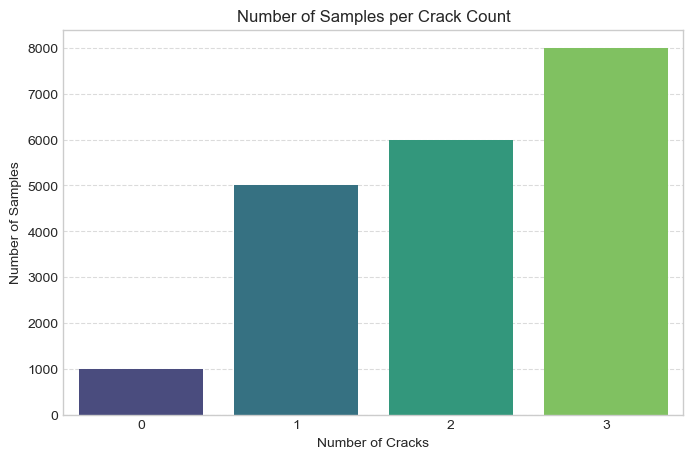


2. Analysis of Physics Validation:
Total samples generated: 20000
Kirchhoff failures (samples discarded due to high residual): 0
Solver failures (samples discarded due to numerical issues): 0
Max residual (mean): 8.77e-16
Max residual (max): 4.00e-15


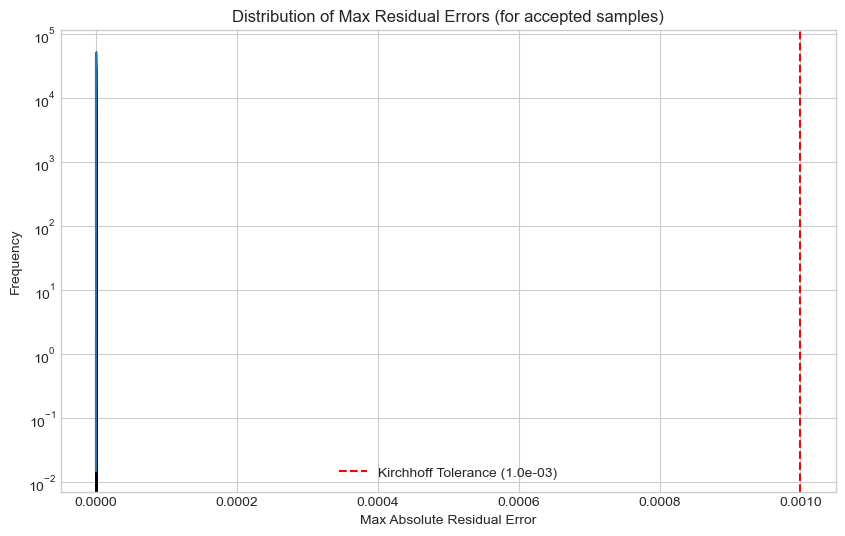


3. Distribution of Signal Magnitude:


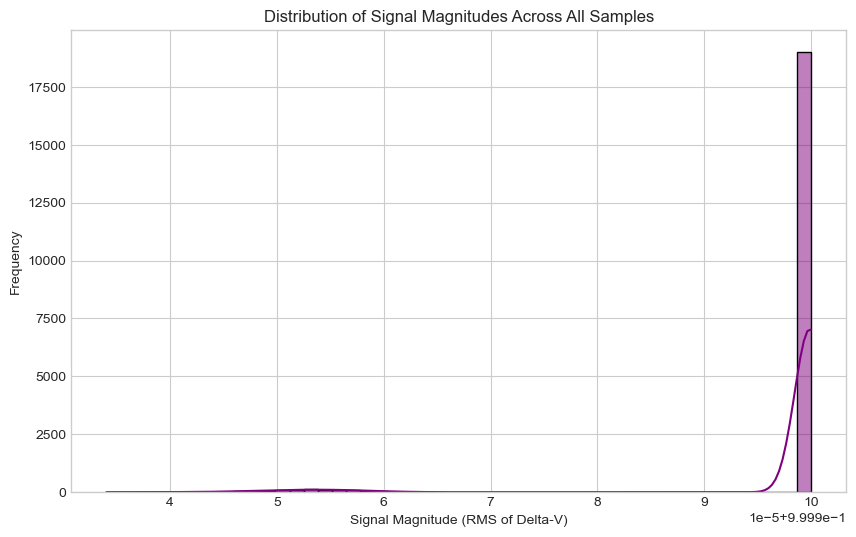

C:\Users\sarab\AppData\Local\Temp\ipykernel_17296\618798618.py:51: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='crack_count', y='signal_magnitude', data=generated_df, palette='cubehelix')


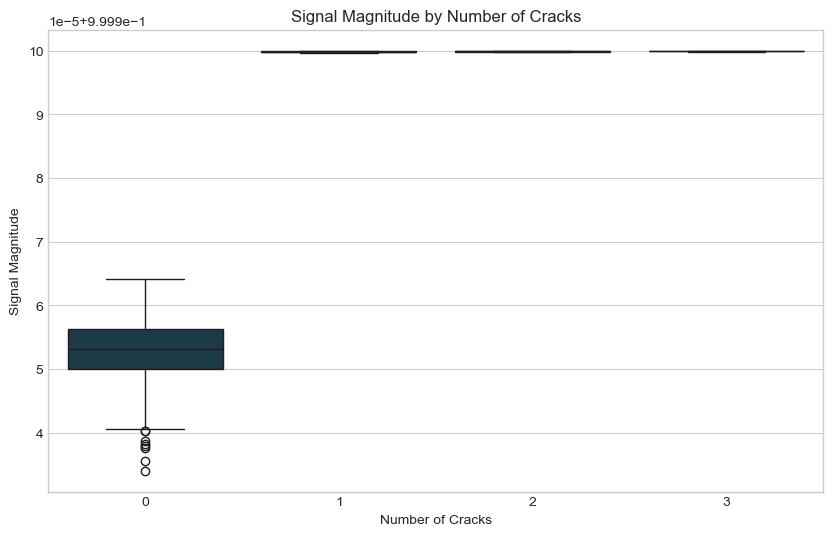


4. Distribution of Crack Placement Types (Random, Clustered, Central):
sample_type
Random       9484
Central      7583
Clustered    1933
Name: count, dtype: int64


C:\Users\sarab\AppData\Local\Temp\ipykernel_17296\618798618.py:66: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=crack_type_counts.index, y=crack_type_counts.values, palette="pastel")


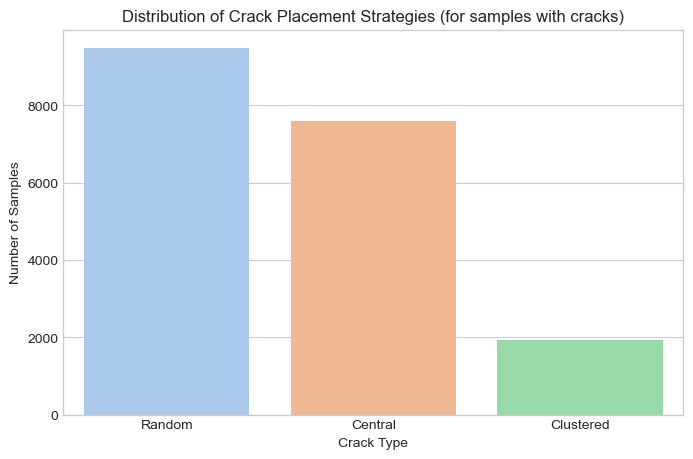


5. Raw Measurements (Delta-V) and Noise Characteristics:


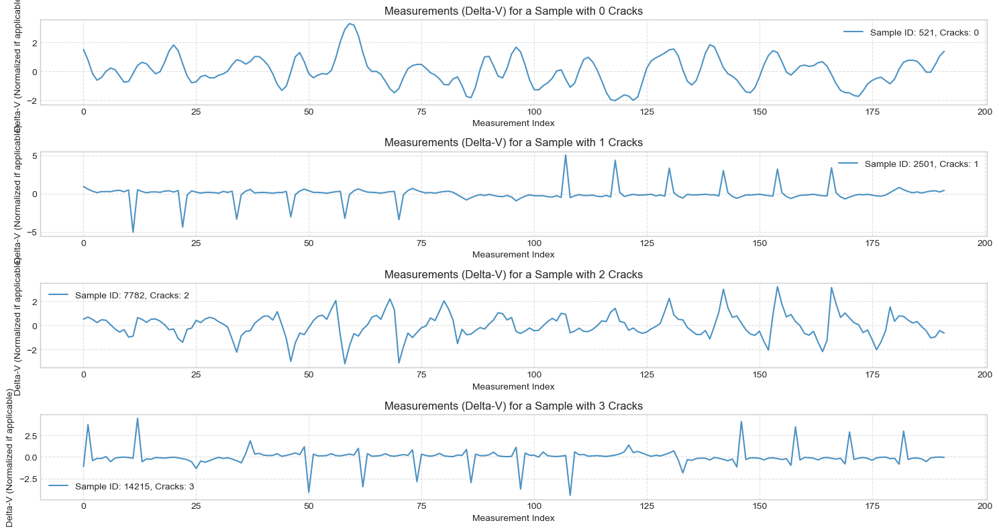


Measurements are normalized (zero mean, unit variance).

--- End of Dataset Analysis ---


In [15]:
# Cell 5: Initial Data Analysis and Validation for Thesis

print("\n--- Dataset Analysis for Thesis ---")

# 1. Distribution of Samples per Crack Count
print("\n1. Distribution of Samples per Crack Count:")
crack_count_distribution = generated_df['crack_count'].value_counts().sort_index()
print(crack_count_distribution)
plt.figure(figsize=(8, 5))
sns.barplot(x=crack_count_distribution.index, y=crack_count_distribution.values, palette="viridis")
plt.title('Number of Samples per Crack Count')
plt.xlabel('Number of Cracks')
plt.ylabel('Number of Samples')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()

# 2. Analysis of Physics Validation (Kirchhoff's Law and Solver Failures)
print("\n2. Analysis of Physics Validation:")
print(f"Total samples generated: {generation_stats_output.get('total_samples_generated', 'N/A')}")
print(f"Kirchhoff failures (samples discarded due to high residual): {generation_stats_output.get('kirchhoff_failures', 'N/A')}")
print(f"Solver failures (samples discarded due to numerical issues): {generation_stats_output.get('solver_failures', 'N/A')}")

max_residuals = np.array(generation_stats_output.get('max_residuals', []))
if len(max_residuals) > 0:
    print(f"Max residual (mean): {np.mean(max_residuals):.2e}")
    print(f"Max residual (max): {np.max(max_residuals):.2e}")
    plt.figure(figsize=(10, 6))
    sns.histplot(max_residuals[max_residuals < s.kirchhoff_tol * 10], bins=50, kde=True) # Plot within a reasonable range
    plt.title('Distribution of Max Residual Errors (for accepted samples)')
    plt.xlabel('Max Absolute Residual Error')
    plt.ylabel('Frequency')
    plt.yscale('log') # Use log scale for frequency due to many small residuals
    plt.axvline(s.kirchhoff_tol, color='r', linestyle='--', label=f'Kirchhoff Tolerance ({s.kirchhoff_tol:.1e})')
    plt.legend()
    plt.show()
else:
    print("No residual data available or all samples failed physics checks.")


# 3. Distribution of Signal Magnitude
print("\n3. Distribution of Signal Magnitude:")
plt.figure(figsize=(10, 6))
sns.histplot(generated_df['signal_magnitude'], bins=50, kde=True, color='purple')
plt.title('Distribution of Signal Magnitudes Across All Samples')
plt.xlabel('Signal Magnitude (RMS of Delta-V)')
plt.ylabel('Frequency')
plt.show()

# You might want to break this down by crack count
plt.figure(figsize=(10, 6))
sns.boxplot(x='crack_count', y='signal_magnitude', data=generated_df, palette='cubehelix')
plt.title('Signal Magnitude by Number of Cracks')
plt.xlabel('Number of Cracks')
plt.ylabel('Signal Magnitude')
plt.show()


# 4. Distribution of Crack Types (if cracks are present)
if 'sample_type' in generated_df.columns:
    print("\n4. Distribution of Crack Placement Types (Random, Clustered, Central):")
    sample_type_map = {0: 'Random', 1: 'Clustered', 2: 'Central'}
    crack_type_counts = generated_df[generated_df['crack_count'] > 0]['sample_type'].map(sample_type_map).value_counts()
    print(crack_type_counts)
    if not crack_type_counts.empty:
        plt.figure(figsize=(8, 5))
        sns.barplot(x=crack_type_counts.index, y=crack_type_counts.values, palette="pastel")
        plt.title('Distribution of Crack Placement Strategies (for samples with cracks)')
        plt.xlabel('Crack Type')
        plt.ylabel('Number of Samples')
        plt.show()
    else:
        print("No samples with cracks to analyze crack placement types.")


# 5. Visualizing Raw Measurements (Delta-V) and Noise characteristics
print("\n5. Raw Measurements (Delta-V) and Noise Characteristics:")
# Take a few random samples (e.g., 5 samples with 0, 1, 2, 3 cracks)
sample_ids_to_plot = []
for n_cracks in sorted(generated_df['crack_count'].unique()):
    samples_with_n_cracks = generated_df[generated_df['crack_count'] == n_cracks]
    if not samples_with_n_cracks.empty:
        sample_ids_to_plot.append(samples_with_n_cracks.sample(1, random_state=42)['sample_id'].iloc[0])

plt.figure(figsize=(15, 8))
for i, sample_id in enumerate(sample_ids_to_plot):
    sample_data = generated_df[generated_df['sample_id'] == sample_id]
    crack_count = sample_data['crack_count'].iloc[0]
    
    # Extract only the delta_V columns
    delta_v_cols = [col for col in generated_df.columns if col.startswith('delta_')]
    measurements = sample_data[delta_v_cols].iloc[0].values

    plt.subplot(len(sample_ids_to_plot), 1, i + 1)
    plt.plot(measurements, label=f'Sample ID: {sample_id}, Cracks: {crack_count}', alpha=0.8)
    plt.title(f'Measurements (Delta-V) for a Sample with {crack_count} Cracks')
    plt.xlabel('Measurement Index')
    plt.ylabel('Delta-V (Normalized if applicable)')
    plt.legend()
    plt.grid(True, linestyle='--', alpha=0.6)
plt.tight_layout()
plt.show()

# If measurements are normalized, show the effect of normalization
if s.normalize_measurements:
    print(f"\nMeasurements are normalized (zero mean, unit variance).")
    # You could add a plot here showing before/after normalization if you capture the raw measurements too.
    # For now, just a confirmation.

print("\n--- End of Dataset Analysis ---")